In [1]:
import random
import torch
import numpy as np
from torchvision import models
from torch.hub import load_state_dict_from_url
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
import matplotlib
import numpy as np
import os
import PIL
import tensorflow as tf
import cv2


from pathlib import Path
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras import optimizers

In [2]:
import os

os.environ["CUDA_VISIBLE_DEVICES"]="0"
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        tf.config.experimental.set_memory_growth(gpus[0], True)
    except RuntimeError as e:
        print(e)

In [3]:
def load_mnist(path, kind='train'):
    import os
    import gzip
    import numpy as np

    """Load MNIST data from `path`"""
    labels_path = os.path.join(path,
                               '%s-labels-idx1-ubyte.gz'
                               % kind)
    images_path = os.path.join(path,
                               '%s-images-idx3-ubyte.gz'
                               % kind)

    with gzip.open(labels_path, 'rb') as lbpath:
        labels = np.frombuffer(lbpath.read(), dtype=np.uint8,
                               offset=8)

    with gzip.open(images_path, 'rb') as imgpath:
        images = np.frombuffer(imgpath.read(), dtype=np.uint8,
                               offset=16).reshape(len(labels), 784)

    return images, labels

In [4]:
# All data path
data_dir1 = 0
data_dir2 = 0
data_dir3 = 0
data_dir4 = 0
data_dir5 = 0
data_dir6 = 0
data_dir7 = 0
data_dir8 = 0
data_dir9 = 0
data_dir10 = 0
data_dir11 = 0
data_dir12 = 0
data_dir13 = 0
data_dir14 = 0
data_dir15 = 0
data_dir16 = 0
data_dir17 = 0
data_dir18 = 0
data_dir19 = 0
data_dir20 = 0
data_dir21 = 0
data_dir22 = 0
# paths = [data_dir1, data_dir2, data_dir3, data_dir4, data_dir5, data_dir6, data_dir7, data_dir8, data_dir9, data_dir10,
#         data_dir11, data_dir12, data_dir13, data_dir14, data_dir15, data_dir16, data_dir17, data_dir18, data_dir19,
#          data_dir20, data_dir21, data_dir22]

# data_dir = Path(data_dir)

In [5]:
# Some data path
data_dir1 = '/Users/CAL/Desktop/Lab/Gravity_spy_project/H1L1_G_time_labeled_c/1080Lines'
# data_dir2 = '/Users/CAL/Desktop/Lab/Gravity_spy_project/H1L1_G_time_labeled_c/1400Ripples'
# data_dir3 = '/Users/CAL/Desktop/Lab/Gravity_spy_project/H1L1_G_time_labeled_c/Air_Compressor'
data_dir4 = '/Users/CAL/Desktop/Lab/Gravity_spy_project/H1L1_G_time_labeled_c/Blip'
data_dir5 = '/Users/CAL/Desktop/Lab/Gravity_spy_project/H1L1_G_time_labeled_c/Chirp'
data_dir6 = '/Users/CAL/Desktop/Lab/Gravity_spy_project/H1L1_G_time_labeled_c/Extremely_Loud'
data_dir7 = '/Users/CAL/Desktop/Lab/Gravity_spy_project/H1L1_G_time_labeled_c/Helix'
data_dir8 = '/Users/CAL/Desktop/Lab/Gravity_spy_project/H1L1_G_time_labeled_c/Koi_Fish'
# data_dir9 = '/Users/CAL/Desktop/Lab/Gravity_spy_project/H1L1_G_time_labeled_c/Light_Modulation'
# data_dir10 = '/Users/CAL/Desktop/Lab/Gravity_spy_project/H1L1_G_time_labeled_c/Low_Frequency_Burst'
data_dir11 = '/Users/CAL/Desktop/Lab/Gravity_spy_project/H1L1_G_time_labeled_c/Low_Frequency_Lines'
# data_dir12 = '/Users/CAL/Desktop/Lab/Gravity_spy_project/H1L1_G_time_labeled_c/No_Glitch'
# data_dir13 = '/Users/CAL/Desktop/Lab/Gravity_spy_project/H1L1_G_time_labeled_c/None_of_the_Above'
data_dir14 = '/Users/CAL/Desktop/Lab/Gravity_spy_project/H1L1_G_time_labeled_c/Paired_Doves'
data_dir15 = '/Users/CAL/Desktop/Lab/Gravity_spy_project/H1L1_G_time_labeled_c/Power_line'
data_dir16 = '/Users/CAL/Desktop/Lab/Gravity_spy_project/H1L1_G_time_labeled_c/Repeating_Blips'
# data_dir17 = '/Users/CAL/Desktop/Lab/Gravity_spy_project/H1L1_G_time_labeled_c/Scattered_Light'
data_dir18 = '/Users/CAL/Desktop/Lab/Gravity_spy_project/H1L1_G_time_labeled_c/Scratchy'
# data_dir19 = '/Users/CAL/Desktop/Lab/Gravity_spy_project/H1L1_G_time_labeled_c/Tomte'
# data_dir20 = '/Users/CAL/Desktop/Lab/Gravity_spy_project/H1L1_G_time_labeled_c/Violin_Mode'
data_dir21 = '/Users/CAL/Desktop/Lab/Gravity_spy_project/H1L1_G_time_labeled_c/Wandering_Line'
# data_dir22 = '/Users/CAL/Desktop/Lab/Gravity_spy_project/H1L1_G_time_labeled_c/Whistle'

paths_a = [data_dir1, data_dir2, data_dir3, data_dir4, data_dir5, data_dir6, data_dir7, data_dir8, data_dir9, data_dir10,
        data_dir11, data_dir12, data_dir13, data_dir14, data_dir15, data_dir16, data_dir17, data_dir18, data_dir19,
         data_dir20, data_dir21, data_dir22]
paths = list()
for i in range(len(paths_a)):
    if str(type(paths_a[i])) == "<class 'str'>":
        paths.append(paths_a[i])
    



In [6]:
paths

['/Users/CAL/Desktop/Lab/Gravity_spy_project/H1L1_G_time_labeled_c/1080Lines',
 '/Users/CAL/Desktop/Lab/Gravity_spy_project/H1L1_G_time_labeled_c/Blip',
 '/Users/CAL/Desktop/Lab/Gravity_spy_project/H1L1_G_time_labeled_c/Chirp',
 '/Users/CAL/Desktop/Lab/Gravity_spy_project/H1L1_G_time_labeled_c/Extremely_Loud',
 '/Users/CAL/Desktop/Lab/Gravity_spy_project/H1L1_G_time_labeled_c/Helix',
 '/Users/CAL/Desktop/Lab/Gravity_spy_project/H1L1_G_time_labeled_c/Koi_Fish',
 '/Users/CAL/Desktop/Lab/Gravity_spy_project/H1L1_G_time_labeled_c/Low_Frequency_Lines',
 '/Users/CAL/Desktop/Lab/Gravity_spy_project/H1L1_G_time_labeled_c/Paired_Doves',
 '/Users/CAL/Desktop/Lab/Gravity_spy_project/H1L1_G_time_labeled_c/Power_line',
 '/Users/CAL/Desktop/Lab/Gravity_spy_project/H1L1_G_time_labeled_c/Repeating_Blips',
 '/Users/CAL/Desktop/Lab/Gravity_spy_project/H1L1_G_time_labeled_c/Scratchy',
 '/Users/CAL/Desktop/Lab/Gravity_spy_project/H1L1_G_time_labeled_c/Wandering_Line']

In [7]:
sample_images = list(Path(data_dir4+'/4s').glob('./*'))

In [8]:
sample_images

[WindowsPath('/Users/CAL/Desktop/Lab/Gravity_spy_project/H1L1_G_time_labeled_c/Blip/4s/0.png'),
 WindowsPath('/Users/CAL/Desktop/Lab/Gravity_spy_project/H1L1_G_time_labeled_c/Blip/4s/1.png'),
 WindowsPath('/Users/CAL/Desktop/Lab/Gravity_spy_project/H1L1_G_time_labeled_c/Blip/4s/10.png'),
 WindowsPath('/Users/CAL/Desktop/Lab/Gravity_spy_project/H1L1_G_time_labeled_c/Blip/4s/100.png'),
 WindowsPath('/Users/CAL/Desktop/Lab/Gravity_spy_project/H1L1_G_time_labeled_c/Blip/4s/1000.png'),
 WindowsPath('/Users/CAL/Desktop/Lab/Gravity_spy_project/H1L1_G_time_labeled_c/Blip/4s/1001.png'),
 WindowsPath('/Users/CAL/Desktop/Lab/Gravity_spy_project/H1L1_G_time_labeled_c/Blip/4s/1002.png'),
 WindowsPath('/Users/CAL/Desktop/Lab/Gravity_spy_project/H1L1_G_time_labeled_c/Blip/4s/1003.png'),
 WindowsPath('/Users/CAL/Desktop/Lab/Gravity_spy_project/H1L1_G_time_labeled_c/Blip/4s/1004.png'),
 WindowsPath('/Users/CAL/Desktop/Lab/Gravity_spy_project/H1L1_G_time_labeled_c/Blip/4s/1005.png'),
 WindowsPath('/User

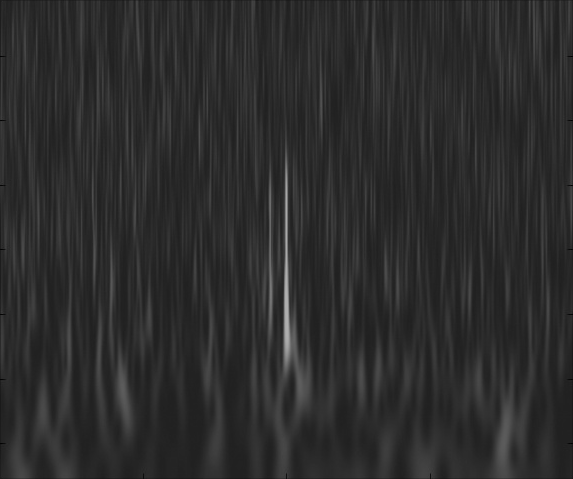

In [9]:
# sample_image = cv2.resize(asarray(sample_images[1]), (100, 85))               #픽셀 뭉개기
# a=np.array(sample_images[1])
PIL.Image.open(str(sample_images[1]))

In [10]:
from PIL import Image
 
image1 = Image.open(str(sample_images[1]))

imag1_size = image1.size
# image1=asarray(image1)
# type(image1)
# image1= cv2.resize(image1, (100, 85))               #픽셀 뭉개기
# image1

imag1_size = image1.size
print(imag1_size)

(573, 479)


In [11]:
from numpy import asarray
image = Image.open(str(sample_images[13]))
data = asarray(image)
print(type(data))
print(data.shape)
print(data)

<class 'numpy.ndarray'>
(479, 573)
[[28 37 44 ... 29 33 32]
 [33 44 57 ... 36 41 40]
 [31 48 54 ... 39 43 39]
 ...
 [28 36 33 ... 39 43 29]
 [25 33 37 ... 38 38 29]
 [25 27 28 ... 30 32 23]]


In [12]:
len(sample_images)

1869

In [13]:
All_images = list()
y_train = np.zeros(40000)
count_y = 0

 
num_cat = len(paths)             # 원래 총 개수는 range 22
for i in range(num_cat): 
    image_group = list(Path(paths[i]+'/0.5s').glob('./*'))
    count_group_num = 0
    for j in range(len(image_group)):
        image = Image.open(str(image_group[j]))
        image = asarray(image)
#         image = cv2.resize(image, (100, 85))               #픽셀 뭉개기
        All_images.append(image)
        y_train[count_y] = i
        count_y += 1
        count_group_num += 1
#         if count_group_num >= 1000:                       #이미지 개수 제한 걸기
#             break

In [14]:
# All images 로 y_train 크기 변환
y_train = np.zeros(len(All_images))
All_images = list()
count_y = 0

 
num_cat = len(paths)             # 원래 총 개수는 range 22
for i in range(num_cat): 
    image_group = list(Path(paths[i]+'/0.5s').glob('./*'))
    count_group_num = 0
    for j in range(len(image_group)):
        image = Image.open(str(image_group[j]))
        image = asarray(image)
#         image = cv2.resize(image, (100, 85))               #픽셀 뭉개기
        All_images.append(image)
        y_train[count_y] = i
        count_y += 1
        count_group_num += 1
#         if count_group_num >= 1000:                        #이미지 개수 제한걸기
#             break

In [15]:
image_group = list(Path(paths[0]).glob('./*'))
len(image_group)

4

In [16]:
len(All_images)

5442

In [17]:
type(y_train)

numpy.ndarray

In [18]:
np.ravel(All_images[3], order='C').shape

(274467,)

In [19]:
len_x = np.ravel(All_images[3], order='C').shape[0]
len_x

274467

In [20]:
X_train = np.zeros((len(All_images),len_x))
for i in range(len(All_images)):
    x = np.ravel(All_images[i], order='C')
    for j in range(len_x):
        X_train[i][j] = x[j]

In [21]:
a = np.ravel(All_images[0], order='C')
X_train[0]

array([31., 31., 28., ..., 32., 33., 26.])

In [22]:
X_train.shape

(5442, 274467)

In [23]:
y_train.shape

(5442,)

In [24]:
np.unique(y_train)

array([ 0.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11.])

In [25]:
import time
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patheffects as PathEffects
%matplotlib inline

import seaborn as sns
sns.set_style('darkgrid')
sns.set_palette('muted')
sns.set_context("notebook", font_scale=1.5,
                rc={"lines.linewidth": 2.5})
RS = 123

In [26]:
len(np.unique(y_train))

12

In [27]:
 # Utility function to visualize the outputs of PCA and t-SNE

def fashion_scatter(x, colors):
    # choose a color palette with seaborn.
    num_classes = len(np.unique(colors))
    palette = np.array(sns.color_palette("hls", num_classes))

    # create a scatter plot.
    f = plt.figure(figsize=(8, 8))
    ax = plt.subplot(aspect='equal')
    sc = ax.scatter(x[:,0], x[:,1], lw=0, s=40, c=palette[colors.astype(np.int64)])  #, c=palette[colors.astype(np.int64)] error occured from np.int -> np.int64
    plt.xlim(-25, 25)
    plt.ylim(-25, 25)
    ax.axis('off')
    ax.axis('tight')

    # add the labels for each digit corresponding to the label
    txts = []

    for i in range(num_classes):

        # Position of each label at median of data points.

        xtext, ytext = np.median(x[colors == i, :], axis=0)
        txt = ax.text(xtext, ytext, str(i), fontsize=24)
        txt.set_path_effects([
            PathEffects.Stroke(linewidth=5, foreground="w"),
            PathEffects.Normal()])
        txts.append(txt)

    return f, ax, sc, txts

In [28]:
# Utility function to visualize the outputs of PCA and t-SNE 
#                     ***(legend added)***

def fashion_scatter2D(x, colors):
    # choose a color palette with seaborn.
    num_classes = len(np.unique(colors))
    palette = np.array(sns.color_palette("hls", num_classes))

    # create a scatter plot.
    f = plt.figure(figsize=(8, 8))
    ax = plt.subplot(aspect='equal')
    sc = ax.scatter(x[:,0], x[:,1], lw=0, s=40, c=palette[colors.astype(np.int64)])  #, c=palette[colors.astype(np.int64)] error occured from np.int -> np.int64
    plt.xlim(-25, 25)
    plt.ylim(-25, 25)
    ax.axis('off')
    ax.axis('tight')
    
    # produce a legend with the unique colors from the scatter
    classes=['1. 1080Lines', '2. Blip', '3. Chirp', '4. Extremely_Loud', '5. Helix', '6. Koi_Fish', '7. Low_Frequency_Lines', '8. Paired_Doves', '9. Power_line', '10. Repeating_Blips', '11. Scratchy', '12. Wandering_Line']
    class_colours = palette[np.unique(colors).astype(np.int64)]
    recs=[]
    for i in range(0, len(class_colours)):
        recs.append(matplotlib.patches.Rectangle((0,0), 1, 1, fc=class_colours[i]))
    plt.legend(recs, classes, loc='best', bbox_to_anchor=(1, 1), fontsize=15)

    # add the labels for each digit corresponding to the label
    txts = []

    for i in range(num_classes):

        # Position of each label at median of data points.

        xtext, ytext = np.median(x[colors == i, :], axis=0)
        txt = ax.text(xtext, ytext, str(i+1), fontsize=24)
        txt.set_path_effects([
            PathEffects.Stroke(linewidth=5, foreground="w"),
            PathEffects.Normal()])
        txts.append(txt)

    return f, ax, sc, txts

In [29]:
# Utility function to visualize the outputs of PCA and t-SNE 
#                     ***(legend added)***

def fashion_scatter2D_PCA(x, colors):
    # choose a color palette with seaborn.
    num_classes = len(np.unique(colors))
    palette = np.array(sns.color_palette("hls", num_classes))

    # create a scatter plot.
    f = plt.figure(figsize=(8, 8))
    ax = plt.subplot(aspect='equal')
    sc = ax.scatter(x[:,0], x[:,1], lw=0, s=40, c=palette[colors.astype(np.int64)])  #, c=palette[colors.astype(np.int64)] error occured from np.int -> np.int64
    plt.xlim(-25, 25)
    plt.ylim(-25, 25)
    ax.axis('off')
    ax.axis('tight')
    
    # produce a legend with the unique colors from the scatter
    classes=['1. 1080Lines', '2. Blip', '3. Chirp', '4. Extremely_Loud', '5. Helix', '6. Koi_Fish', '7. Low_Frequency_Lines', '8. Paired_Doves', '9. Power_line', '10. Repeating_Blips', '11. Scratchy', '12. Wandering_Line']
    class_colours = palette[np.unique(colors).astype(np.int64)]
    recs=[]
    for i in range(0, len(class_colours)):
        recs.append(matplotlib.patches.Rectangle((0,0), 1, 1, fc=class_colours[i]))
    plt.legend(recs, classes, loc='best', bbox_to_anchor=(1, 1), fontsize=15)

    # add the labels for each digit corresponding to the label
    txts = []

    for i in range(num_classes):

        # Position of each label at median of data points.

        xtext= -20000
        ytext= 4000*i
        txt = ax.text(xtext, ytext, str(i+1), fontsize=24)
        txt.set_path_effects([
            PathEffects.Stroke(linewidth=5, foreground="w"),
            PathEffects.Normal()])
        txts.append(txt)

    return f, ax, sc, txts

In [30]:
#     num_classes = len(np.unique(y_subset))
#     colors=y_subset
#     x=data_2D
#     palette = np.array(sns.color_palette("hls", num_classes))

#     # create a scatter plot.
#     f = plt.figure(figsize=(8, 8))
#     ax = plt.subplot(aspect='equal')
#     sc = ax.scatter(x[:,0], x[:,1], lw=0, s=40, c=palette[colors.astype(np.int64)])  #, c=palette[colors.astype(np.int64)] error occured from np.int -> np.int64
#     plt.xlim(-25, 25)
#     plt.ylim(-25, 25)
#     ax.axis('off')
#     ax.axis('tight')
    
#     # produce a legend with the unique colors from the scatter
#     classes=['1080Lines', 'Blip', 'Chirp', 'Extremely_Loud', 'Helix', 'Koi_Fish', 'Low_Frequency_Lines', 'Paired_Doves', 'Power_line', 'Repeating_Blips', 'Scratchy', 'Wandering_Line']
#     class_colours = palette[np.unique(colors).astype(np.int64)]
#     recs=[]
#     for i in range(0, len(class_colours)):
#         recs.append(matplotlib.patches.Rectangle((0,0), 1, 1, fc=class_colours[i]))
#     plt.legend(recs, classes, loc='best', bbox_to_anchor=(1, 1), fontsize=10)
# #     legend1 = ax.legend(*sc.legend_elements(),loc='lower left', title='classes')
# #     ax.add_artist(legend1)
# plt.show()

In [31]:
# palette[np.unique(colors).astype(np.int64)]

In [32]:
 # Utility function to visualize the outputs of PCA and t-SNE

# arranged for 3D

def fashion_scatter3D(x, colors):
    # choose a color palette with seaborn.
    num_classes = len(np.unique(colors))
    palette = np.array(sns.color_palette("hls", num_classes))

    # create a scatter plot.
    f = plt.figure(figsize=(8, 8))
    ax = plt.subplot(aspect='equal')
    sc = ax.scatter(x[:,0], x[:,1], x[:,2], lw=0, s=40, c=palette[colors.astype(np.int64)])  #, c=palette[colors.astype(np.int64)] error occured from np.int -> np.int64
    plt.xlim(-25, 25)
    plt.ylim(-25, 25)
    plt.zlim(-25, 25)
    ax.axis('off')
    ax.axis('tight')

    # add the labels for each digit corresponding to the label
    txts = []

    for i in range(num_classes):

        # Position of each label at median of data points.

        xtext, ytext, ztext = np.median(x[colors == i, :], axis=0)
        txt = ax.text(xtext, ytext, ztext, str(i), fontsize=24)
        txt.set_path_effects([
            PathEffects.Stroke(linewidth=5, foreground="w"),
            PathEffects.Normal()])
        txts.append(txt)

    return f, ax, sc, txts

In [33]:
 # Subset first 20k data points to visualize
x_subset = X_train[0:len(All_images)]
# x_subset = X_train[0:5000]
y_subset = y_train[0:len(All_images)]
# y_subset = y_train[0:5000]

print(np.unique(y_subset))

[ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11.]


In [34]:
x_subset[246]

array([31., 35., 34., ..., 40., 41., 32.])

In [35]:
num=0
for i in range(len(x_subset[0])):
    if x_subset[246][i] == 0:
        num += 1
print(num)

0


In [36]:
from sklearn.decomposition import PCA

time_start = time.time()

pca = PCA(n_components=4)
pca_result = pca.fit_transform(x_subset)

print('PCA done! Time elapsed: {} seconds'.format(time.time()-time_start))

PCA done! Time elapsed: 46.03394079208374 seconds


In [38]:
 pca_df = pd.DataFrame(columns = ['pca1','pca2','pca3','pca4'])

pca_df['pca1'] = pca_result[:,0]
pca_df['pca2'] = pca_result[:,1]
pca_df['pca3'] = pca_result[:,2]
pca_df['pca4'] = pca_result[:,3]

print('Variance explained per principal component: {}'.format(pca.explained_variance_ratio_))

Variance explained per principal component: [0.58044592 0.10072318 0.04203512 0.03468912]


In [39]:
type(y_subset)

numpy.ndarray

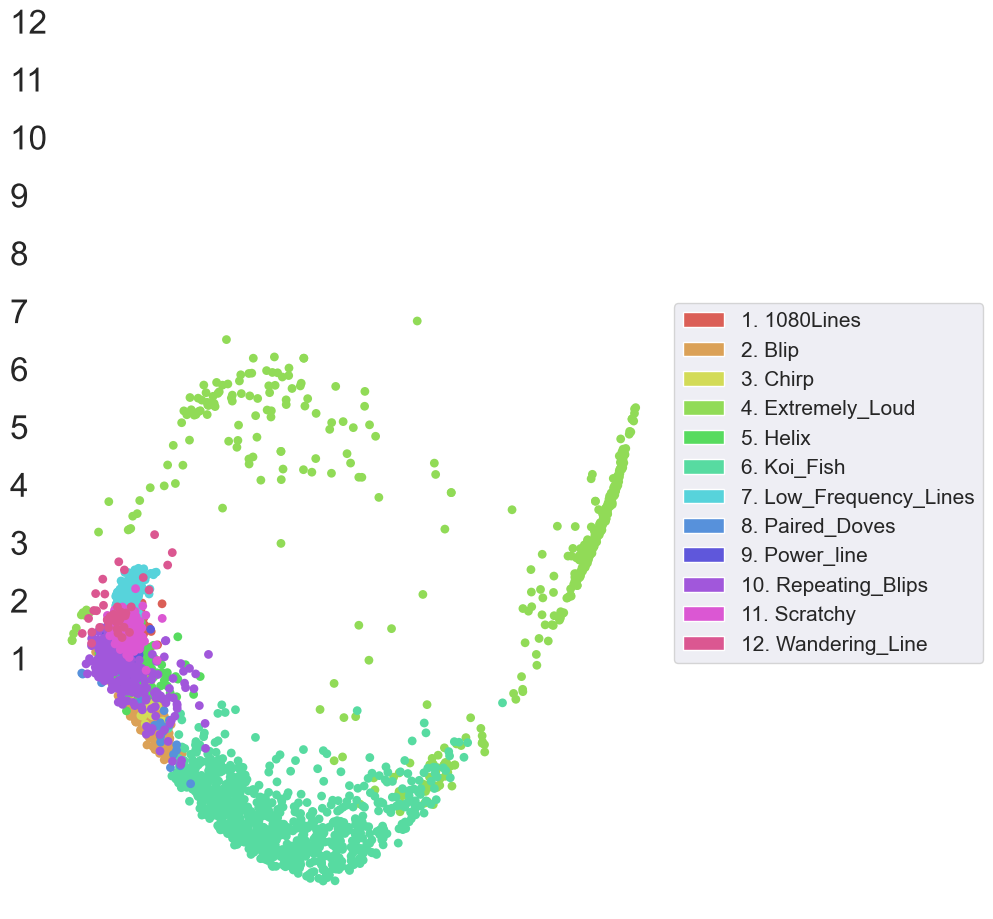

In [63]:
top_two_comp = pca_df[['pca1','pca2']] # taking first and second principal component

fashion_scatter2D_PCA(top_two_comp.values,y_subset) # Visualizing the PCA output
plt.savefig('pca_fig.png', bbox_inches='tight')

In [57]:
# silhouette_coef, silhouette_val_list = get_silhouette_results(top_two_comp.values, y_subset)
# print(silhouette_coef)

0.3247642599145275


In [60]:
# import seaborn as sns
# # 각 클러스터별로 Silhouete 값을 정렬

# labels = y_subset
# uniq_labels = np.unique(labels)
# sorted_cluster_svl = []
# rearr_labels = []
# for ul in uniq_labels:
#     labels_idx = np.where(labels==ul)[0]
#     target_svl = silhouette_val_list[labels_idx]
#     sorted_cluster_svl += sorted(target_svl)
#     rearr_labels += [ul]*len(target_svl)
    
# colors = sns.color_palette('hls', len(uniq_labels))
# color_labels = [colors[int(i)] for i in rearr_labels]

# fig = plt.figure(figsize=(300, 500))
# fig.set_facecolor('white')
# plt.barh(range(len(sorted_cluster_svl)), sorted_cluster_svl, color=color_labels)

# # plt.title('Silhouette Values', fontsize=1000)
# # plt.ylabel('Data Index')
# # plt.xlabel('Silhouette Value')
# plt.savefig('SV Graph(PCA).png')

In [42]:
# 3D t-SNE
from matplotlib import pyplot as plt
import pylab
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits.mplot3d import proj3d
%matplotlib inline
%pylab inline

from sklearn.manifold import TSNE
from sklearn.decomposition import PCA

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


C:\Users\CAL\Anaconda3\envs\tensorflow_v2\lib\site-packages\IPython\core\magics\pylab.py:162: UserWarning: pylab import has clobbered these variables: ['random', 'pylab']
`%matplotlib` prevents importing * from pylab and numpy
  warn("pylab import has clobbered these variables: %s"  % clobbered +


In [40]:
## Parameter를 조정(perplexity)
# 2D t-SNE

from sklearn.manifold import TSNE
time_start = time.time()

# fashion_tsne = TSNE(n_components=2, perplexity=30, learning_rate=700).fit_transform(x_subset)
data_2D = TSNE(n_components=2, perplexity=30).fit_transform(x_subset)

print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

t-SNE done! Time elapsed: 333.2604033946991 seconds


In [41]:
np.unique(y_subset)[1]

1.0

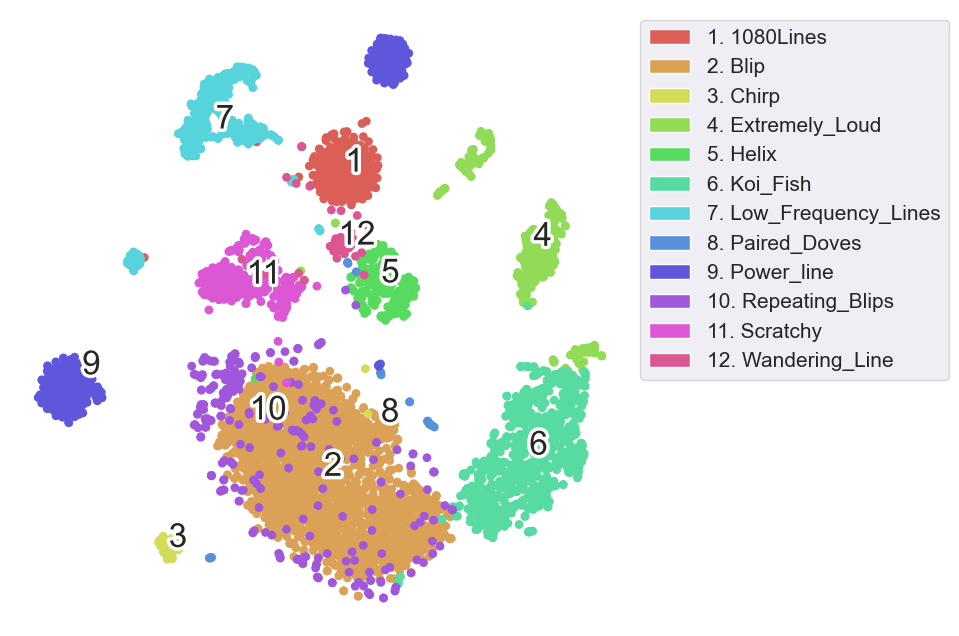

In [42]:
fashion_scatter2D(data_2D, y_subset)
plt.savefig('t_sne fig(2D).png', bbox_inches='tight')

In [43]:
# Silhouette Ceofficient 구하기

def get_silhouette_results(X, labels):
    def get_sum_distance(target_x, target_cluster):
        res = np.sum([np.linalg.norm(target_x-x) for x in target_cluster])
        return res
    
#     각 데이터 포인트를 돌면서 a(i), b(i)를 계산
#     그리고 s(i)를 계산한다.
#     마지막으로 SC를 계산
    
    uniq_labels = np.unique(labels)
    silhouette_val_list = []
    for i in range(len(labels)):
        target_data = X[i]
        
        # calculate a(i)
        target_label = labels[i]
        target_cluster_data_idx = np.where(labels==target_label)[0]
        if len(target_cluster_data_idx) == 1:
            silhouette_val_list.append(0)
            continue
        else:
            target_cluster_data = X[target_cluster_data_idx]
            temp1 = get_sum_distance(target_data, target_cluster_data)
            a_i = temp1/(target_cluster_data.shape[0]-1)
        
        # calculate b(i)
        b_i_list = []
        label_list = uniq_labels[np.unique(labels) != target_label]
        for ll in label_list:
            other_cluster_data_idx = np.where(labels==ll)[0]
            other_cluster_data = X[other_cluster_data_idx]
            temp2 = get_sum_distance(target_data, other_cluster_data)
            temp_b_i = temp2/other_cluster_data.shape[0]
            b_i_list.append(temp_b_i)
            
        b_i = min(b_i_list)
        s_i = (b_i-a_i)/max(a_i, b_i)
        silhouette_val_list.append(s_i)
    
    silhouette_coef_list = []
    for ul in uniq_labels:
        temp3 = np.mean([s for s, l in zip(silhouette_val_list, labels) if l == ul])
        silhouette_coef_list.append(temp3)
    
    silhouette_coef = max(silhouette_coef_list)
    return (silhouette_coef, np.array(silhouette_val_list))

In [44]:
silhouette_coef, silhouette_val_list = get_silhouette_results(data_2D, y_subset)
print(silhouette_coef)

0.8559316746305327


In [49]:
def silhouette_val(silhouette_val_list, y_subset, dim):
    
    import seaborn as sns
    # 각 클러스터별로 Silhouete 값을 정렬

    labels = y_subset
    uniq_labels = np.unique(labels)
    sorted_cluster_svl = []
    rearr_labels = []
    for ul in uniq_labels:
        labels_idx = np.where(labels==ul)[0]
        target_svl = silhouette_val_list[labels_idx]
        sorted_cluster_svl += sorted(target_svl)
        rearr_labels += [ul]*len(target_svl)
    
    colors = sns.color_palette('hls', len(uniq_labels))
    color_labels = [colors[int(i)] for i in rearr_labels]

    fig = plt.figure(figsize=(300, 500))
    fig.set_facecolor('white')
    plt.barh(range(len(sorted_cluster_svl)), sorted_cluster_svl, color=color_labels)

    # plt.title('Silhouette Values', fontsize=1000)
    # plt.ylabel('Data Index')
    # plt.xlabel('Silhouette Value')
    plt.savefig('SV Graph({} dim).png'.format(dim))

In [46]:
silhouette_val(silhouette_val_list, y_subset)

In [43]:
color_labels[0]

(0.86, 0.3712, 0.33999999999999997)

In [44]:
colors[0]

(0.86, 0.3712, 0.33999999999999997)

In [45]:
palette = np.array(sns.color_palette("hls", 12))
c=palette[y_subset.astype(np.int64)]

In [46]:
type(colors)

seaborn.palettes._ColorPalette

In [47]:
type(c)

numpy.ndarray

In [48]:
colors[0]

(0.86, 0.3712, 0.33999999999999997)

In [49]:
# 3D t-SNE

data_3D = TSNE(n_components=3, perplexity=45, random_state=0).fit_transform(x_subset)
# x = list(zip(*data))

# fig = plt.figure()
# ax = fig.gca(projection='3d')

# ax.scatter(x, y, z)

print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

t-SNE done! Time elapsed: 1165.5466856956482 seconds


In [50]:
type(data_3D[:,0])

numpy.ndarray

In [51]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import numpy as np

def scatter_3D(data_3D, colors):
    num_classes = len(np.unique(colors))

    palette = np.array(sns.color_palette("hls", num_classes))

    xs = data_3D[:,0]
    ys = data_3D[:,1]
    zs = data_3D[:,2]
    color = palette[colors.astype(np.int64)]

    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(xs, ys, zs, c=color, marker='o', s=3, cmap='Greens')


C:\Users\CAL\AppData\Local\Temp\ipykernel_6688\4249751968.py:17: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(xs, ys, zs, c=color, marker='o', s=3, cmap='Greens')


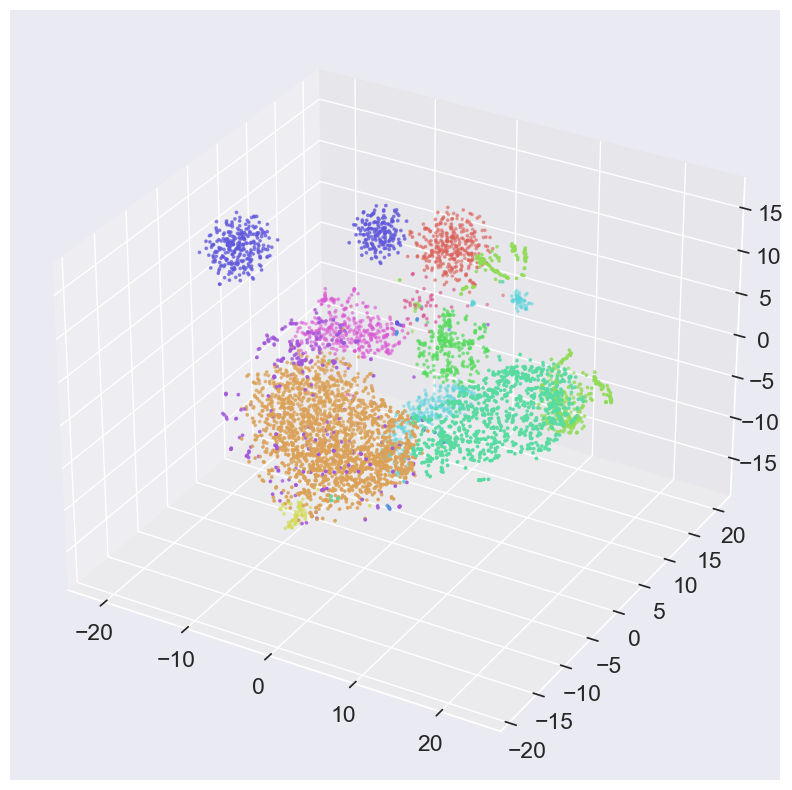

In [52]:

scatter_3D(data_3D, y_subset)
plt.savefig('3D_t_sne fig.png')

In [53]:
silhouette_coef, silhouette_val_list = get_silhouette_results(data_3D, y_subset)
print(silhouette_coef)

0.8679932511036399


In [54]:
data_3D[:,0:2]

array([[-0.47365192, 13.824094  ],
       [-2.4089973 , 14.628705  ],
       [-1.131646  , 11.627037  ],
       ...,
       [-3.119075  ,  6.9404473 ],
       [-0.9544584 ,  7.7212143 ],
       [-1.0312325 ,  7.993136  ]], dtype=float32)

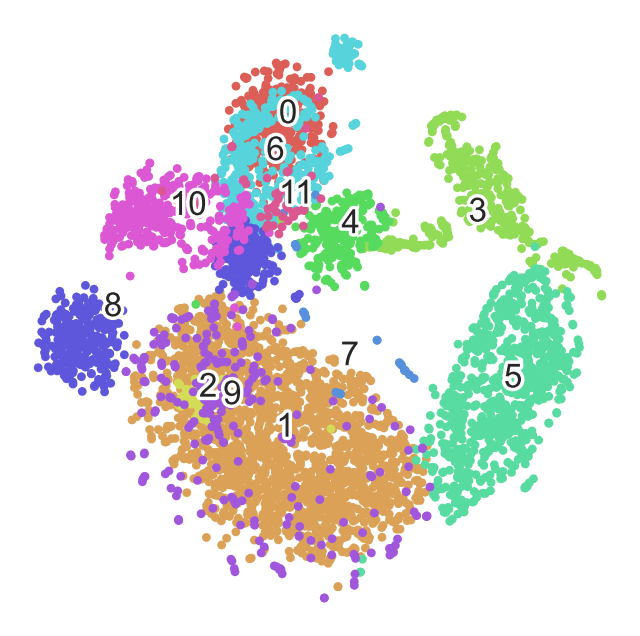

In [55]:
fashion_scatter(data_3D[:,0:2], y_subset)
plt.savefig('3D_t_sne fig(default, x,y projection).png')

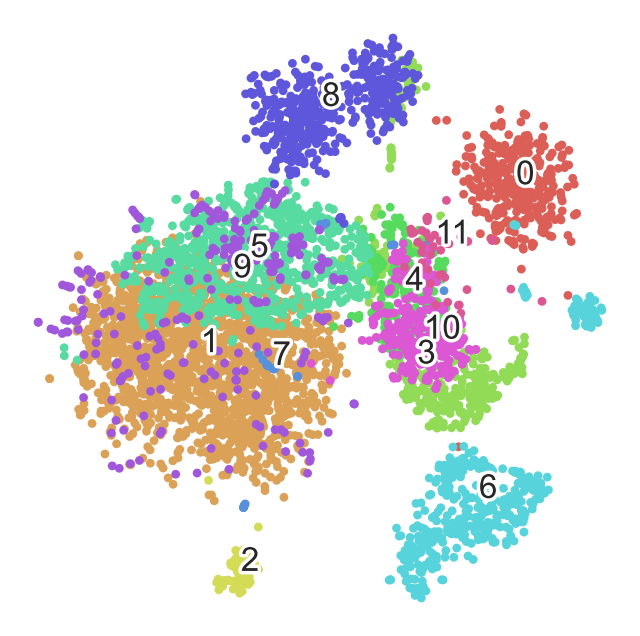

In [56]:
fashion_scatter(data_3D[:,1:3], y_subset)
plt.savefig('3D_t_sne fig(default, y,z projection).png')

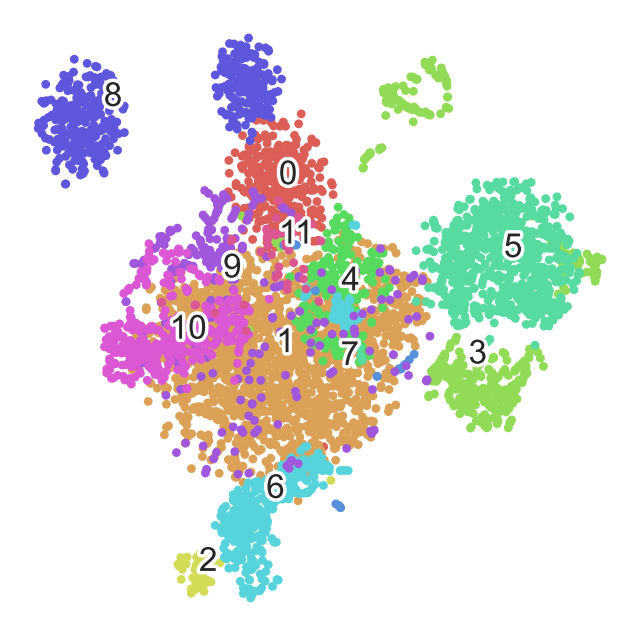

In [57]:
fashion_scatter(data_3D[:,0:3:2], y_subset)
plt.savefig('3D_t_sne fig(default, x,z projection).png')

In [38]:
print('Cumulative variance explained by {} principal components: {}'.format(50,100))

Cumulative variance explained by 50 principal components: 100


In [51]:
a=list()
a.append(1)
a

[1]

In [53]:
# Searching for best pca dimension reduction
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

CVP = list()
SC = list()

for i in range(20):
    n_list=[5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80, 85, 90, 95, 100]
    pca_n=PCA(n_components=n_list[i])
    pca_result_n = pca_n.fit_transform(x_subset)
    print('Cumulative variance explained by {} principal components: {}'.format(n_list[i], np.sum(pca_n.explained_variance_ratio_)))
    CVP.append(np.sum(pca_n.explained_variance_ratio_))
    
    pca_tsne_2D = TSNE(n_components=2, perplexity=30,  random_state=RS).fit_transform(pca_result_n)
#     fashion_scatter2D(pca_tsne_2D, y_subset)
#     plt.savefig('pca_t-sne fig({} dim).png'.format(n_list[i]), bbox_inches='tight')
    
    silhouette_coef, silhouette_val_list = get_silhouette_results(pca_tsne_2D, y_subset)
    print(silhouette_coef)
#     silhouette_val(silhouette_val_list, y_subset, n_list[i])
    SC.append(silhouette_coef)


Cumulative variance explained by 5 principal components: 0.7784943581998258
0.5827425312201253
Cumulative variance explained by 10 principal components: 0.8231644654975043
0.7315312455120526
Cumulative variance explained by 15 principal components: 0.842038483334216
0.8462381497263435
Cumulative variance explained by 20 principal components: 0.8540578816554848
0.8082662303320634
Cumulative variance explained by 25 principal components: 0.8627938793836627
0.8575622224618523
Cumulative variance explained by 30 principal components: 0.8700623996500836
0.8388166494616756
Cumulative variance explained by 35 principal components: 0.8759638415609111
0.9218149528639225
Cumulative variance explained by 40 principal components: 0.8810152421045665
0.8722574068787767
Cumulative variance explained by 45 principal components: 0.885500318028858
0.9026042315167763
Cumulative variance explained by 50 principal components: 0.8894199252585574
0.905081770249537
Cumulative variance explained by 55 principa

In [93]:
plt.style.available

['Solarize_Light2',
 '_classic_test_patch',
 '_mpl-gallery',
 '_mpl-gallery-nogrid',
 'bmh',
 'classic',
 'dark_background',
 'fast',
 'fivethirtyeight',
 'ggplot',
 'grayscale',
 'seaborn-v0_8',
 'seaborn-v0_8-bright',
 'seaborn-v0_8-colorblind',
 'seaborn-v0_8-dark',
 'seaborn-v0_8-dark-palette',
 'seaborn-v0_8-darkgrid',
 'seaborn-v0_8-deep',
 'seaborn-v0_8-muted',
 'seaborn-v0_8-notebook',
 'seaborn-v0_8-paper',
 'seaborn-v0_8-pastel',
 'seaborn-v0_8-poster',
 'seaborn-v0_8-talk',
 'seaborn-v0_8-ticks',
 'seaborn-v0_8-white',
 'seaborn-v0_8-whitegrid',
 'tableau-colorblind10']

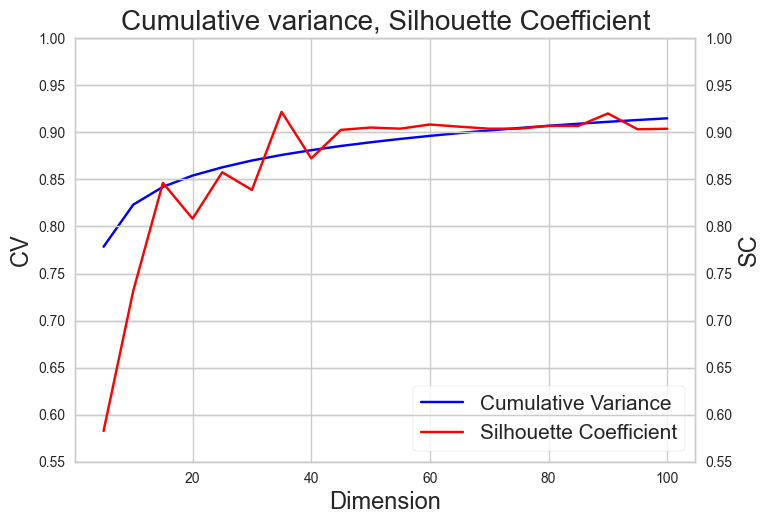

In [178]:
x=n_list
y1, y2=CVP, SC

plt.style.use('seaborn-v0_8-whitegrid')
fig, ax0 = plt.subplots()
ax0.set_xlabel('Dimension', size=17)
ax0.set_ylabel('CV', size=17)
ax0.set_ylim(0.55, 1)

line0 = ax0.plot(x, y1, color='b', label='Cumulative Variance')

ax1 = ax0.twinx()
ax1.set_ylabel('SC', size=17)
ax1.set_ylim(0.55, 1)

line1 = ax1.plot(x, y2, color='r', label='Silhouette Coefficient')

lines = line0+line1

labels = [l.get_label() for l in lines]
ax0.legend(lines, labels, frameon=True, loc='lower right', fontsize=15)
plt.title('Cumulative variance, Silhouette Coefficient', fontsize=20)

# plt.show()
plt.savefig('CV, SC graph', bbox_inches='tight')


# line1 = ax1.plot(x, y1, color='b', alpha=0.5, label='Cumulative variance')
# ax1.set_ylabel('CV', color='b', rotation=0, size=17)
# ax2 = ax1.twinx()
# line2 = ax2.plot(x, y2, 'r', alpha=0.5, label='Silhouette Coefficient')
# ax2.set_ylabel('SC', color='r', rotation=0, size=17)
# ax1.set_xlabel('Dimension')
# ax1.set_xlim(0, 105)
# ax1.set_ylim(0.50, 1.00)
# ax2.set_ylim(0.50, 1.00)
# plt.title('Cumulative variance, Silhouette Coefficient')

# plt.legend(line1+line2,loc=(1.1,0.9), prop={'size':17})
# # ax2.legend(loc=(1.1,0.8), prop={'size':17})
# plt.show()
# # plt.savefig()

In [44]:
# pca & t-sne for 2D

time_start = time.time()

pca_50 = PCA(n_components=50)
pca_result_50 = pca_50.fit_transform(x_subset)

print('PCA with 50 components done! Time elapsed: {} seconds'.format(time.time()-time_start))

print('Cumulative variance explained by 50 principal components: {}'.format(np.sum(pca_50.explained_variance_ratio_)))

PCA with 50 components done! Time elapsed: 100.73224949836731 seconds
Cumulative variance explained by 50 principal components: 0.8894228317938105


In [45]:
## Parameter를 조정(perplexity)
 
import time
time_start = time.time()


pca_tsne_2D = TSNE(n_components=2, perplexity=30,  random_state=RS).fit_transform(pca_result_50)

print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

t-SNE done! Time elapsed: 30.395613193511963 seconds


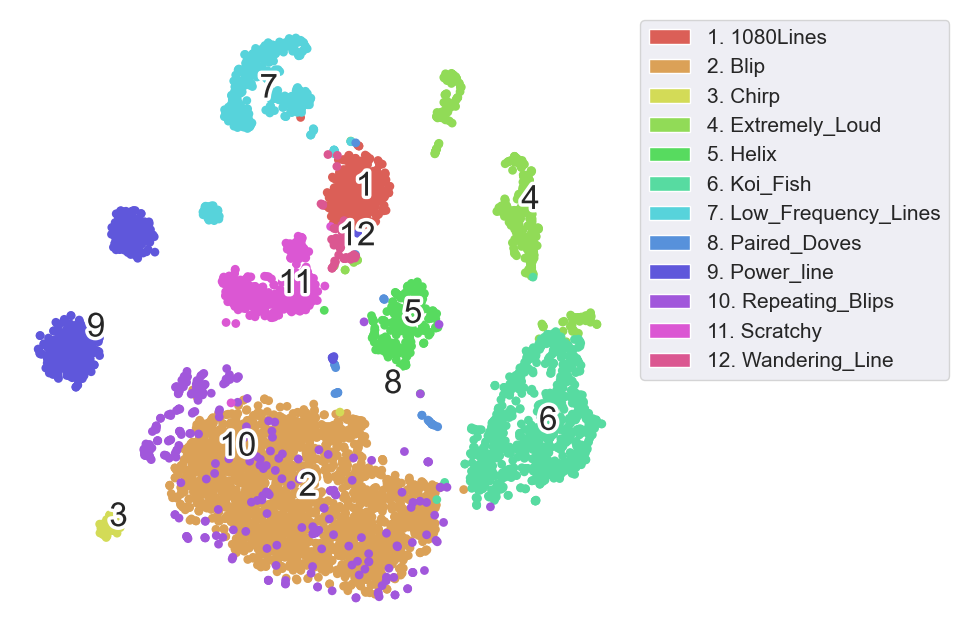

In [52]:
fashion_scatter2D(pca_tsne_2D, y_subset)
plt.savefig('pca_t-sne fig.png', bbox_inches='tight')

In [61]:
silhouette_coef, silhouette_val_list = get_silhouette_results(pca_tsne_2D, y_subset)
print(silhouette_coef)

0.8530500607097439


In [62]:
import seaborn as sns
# 각 클러스터별로 Silhouete 값을 정렬

labels = y_subset
uniq_labels = np.unique(labels)
sorted_cluster_svl = []
rearr_labels = []
for ul in uniq_labels:
    labels_idx = np.where(labels==ul)[0]
    target_svl = silhouette_val_list[labels_idx]
    sorted_cluster_svl += sorted(target_svl)
    rearr_labels += [ul]*len(target_svl)
    
colors = sns.color_palette('hls', len(uniq_labels))
color_labels = [colors[int(i)] for i in rearr_labels]

fig = plt.figure(figsize=(300, 500))
fig.set_facecolor('white')
plt.barh(range(len(sorted_cluster_svl)), sorted_cluster_svl, color=color_labels)

# plt.title('Silhouette Values', fontsize=1000)
# plt.ylabel('Data Index')
# plt.xlabel('Silhouette Value')
plt.savefig('SV Graph.png')

In [61]:
# pca & t-sne for 3D

import time
time_start = time.time()


pca_tsne_3D = TSNE(n_components=3, perplexity=45,  random_state=RS).fit_transform(pca_result_50)

print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

t-SNE done! Time elapsed: 104.55994200706482 seconds


C:\Users\CAL\AppData\Local\Temp\ipykernel_6688\4249751968.py:17: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(xs, ys, zs, c=color, marker='o', s=3, cmap='Greens')


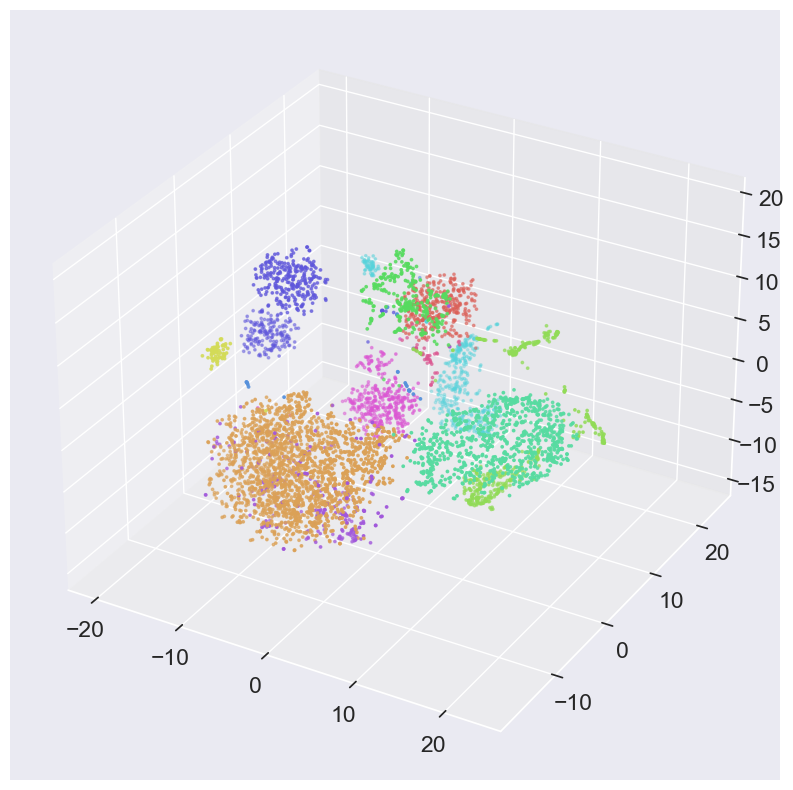

In [62]:
scatter_3D(pca_tsne_3D, y_subset)
plt.savefig('3D_t_sne_pca fig(p=45).png')

In [63]:
silhouette_coef, silhouette_val_list = get_silhouette_results(pca_tsne_3D, y_subset)
print(silhouette_coef)

0.8792353112182709


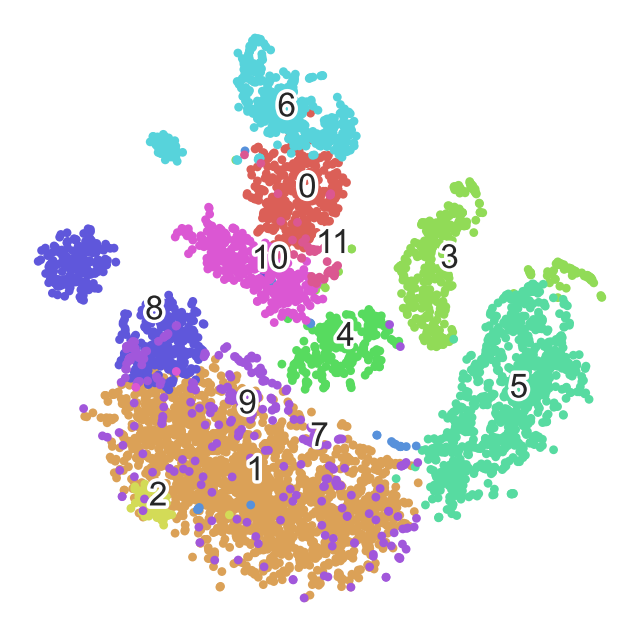

In [64]:
fashion_scatter(pca_tsne_3D[:,0:2], y_subset)
plt.savefig('pca_tsne_3D fig(p=45, x,y projection).png')

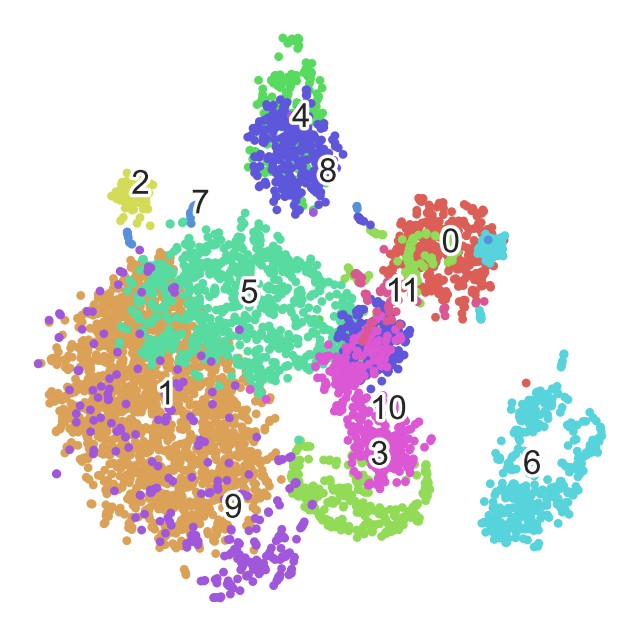

In [65]:
fashion_scatter(pca_tsne_3D[:,1:3], y_subset)
plt.savefig('pca_tsne_3D fig(p=45, y,z projection).png')

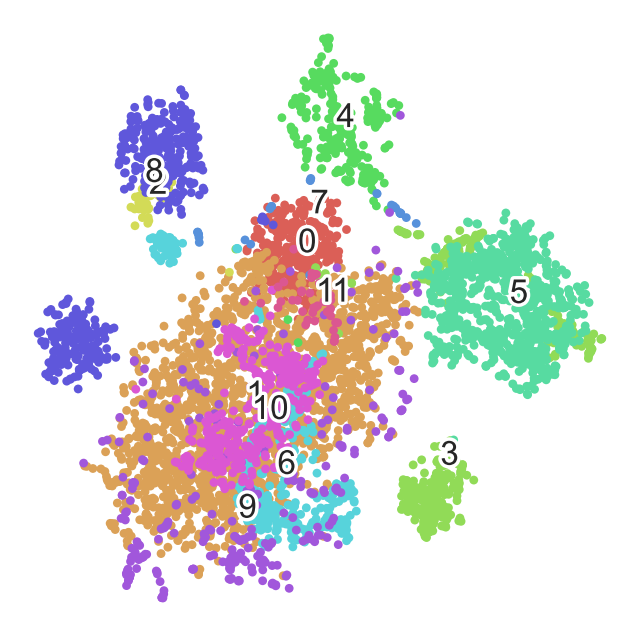

In [66]:
fashion_scatter(pca_tsne_3D[:,0:3:2], y_subset)
plt.savefig('pca_tsne_3D fig(p=45, x,z projection).png')